<a href="https://colab.research.google.com/github/Yashas7206988696/ObesityTrend-LinearRegression/blob/main/linear_regression_obesity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [22]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score
import os
import numpy as np

In [12]:
#please do not run this part of the cell, the file is already uploaded
from google.colab import files
files.upload()

Saving Nutrition__Physical_Activity__and_Obesity_-_Behavioral_Risk_Factor_Surveillance_System.csv to Nutrition__Physical_Activity__and_Obesity_-_Behavioral_Risk_Factor_Surveillance_System.csv


{'Nutrition__Physical_Activity__and_Obesity_-_Behavioral_Risk_Factor_Surveillance_System.csv': b'YearStart,YearEnd,LocationAbbr,LocationDesc,Datasource,Class,Topic,Question,Data_Value_Unit,Data_Value_Type,Data_Value,Data_Value_Alt,Data_Value_Footnote_Symbol,Data_Value_Footnote,Low_Confidence_Limit,High_Confidence_Limit ,Sample_Size,Total,Age(years),Education,Gender,Income,Race/Ethnicity,GeoLocation,ClassID,TopicID,QuestionID,DataValueTypeID,LocationID,StratificationCategory1,Stratification1,StratificationCategoryId1,StratificationID1\n2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who have obesity,,Value,32.0,32.0,,,30.5,33.5,7304,Total,,,,,,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,01,Total,Total,OVR,OVERALL\n2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older

In [15]:
df = pd.read_csv("Nutrition__Physical_Activity__and_Obesity_-_Behavioral_Risk_Factor_Surveillance_System.csv")
df.head()

,YearStart,YearEnd,LocationAbbr,LocationDesc,Datasource,Class,Topic,Question,Data_Value_Unit,Data_Value_Type,Data_Value,Data_Value_Alt,Data_Value_Footnote_Symbol,Data_Value_Footnote,Low_Confidence_Limit,High_Confidence_Limit,Sample_Size,Total,Age(years),Education,Gender,Income,Race/Ethnicity,GeoLocation,ClassID,TopicID,QuestionID,DataValueTypeID,LocationID,StratificationCategory1,Stratification1,StratificationCategoryId1,StratificationID1
0,2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,NaN,Value,32.0,32.0,NaN,NaN,30.5,33.5,7304.0,Total,NaN,NaN,NaN,NaN,NaN,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,1,Total,Total,OVR,OVERALL
1,2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,NaN,Value,32.3,32.3,NaN,NaN,29.9,34.7,2581.0,NaN,NaN,NaN,Male,NaN,NaN,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,1,Gender,Male,GEN,MALE
2,2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,NaN,Value,31.8,31.8,NaN,NaN,30.0,33.6,4723.0,NaN,NaN,NaN,Female,NaN,NaN,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,1,Gender,Female,GEN,FEMALE
3,2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,NaN,Value,33.6,33.6,NaN,NaN,29.9,37.6,1153.0,NaN,NaN,Less than high school,NaN,NaN,NaN,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,1,Education,Less than high school,EDU,EDUHS
4,2011,2011,AL,Alabama,Behavioral Risk Factor Surveillance System,Obesity / Weight Status,Obesity / Weight Status,Percent of adults aged 18 years and older who ...,NaN,Value,32.8,32.8,NaN,NaN,30.2,35.6,2402.0,NaN,NaN,High school graduate,NaN,NaN,NaN,"(32.84057112200048, -86.63186076199969)",OWS,OWS1,Q036,VALUE,1,Education,High school graduate,EDU,EDUHSGRAD


In [17]:
df_filtered = df[df['Class'].isin(['Obesity / Weight Status', 'Fruits and Vegetables', 'Physical Activity'])]
df_pivoted = df_filtered.pivot_table(index=['YearStart', 'LocationDesc', 'Stratification1'],
                                     columns='Question', values='Data_Value', aggfunc='mean').reset_index()

# Step 2: Define predictors and target (adjust if column names vary slightly)
predictors = [
    'Percent of adults who report consuming fruit less than one time daily',  # Food
    'Percent of adults who report consuming vegetables less than one time daily',  # Food
    'Percent of adults who engage in no leisure-time physical activity'  # Exercise
    # Add 'Percent of adults who report consuming sugar-sweetened beverages' for drinks if available
]
target = 'Percent of adults aged 18 years and older who have obesity'

# Step 3: Prepare data and impute missing values
df_model = df_pivoted.dropna(subset=[target])
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(df_model[predictors])
y = df_model[target]

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
model = LinearRegression()
model.fit(X_train, y_train)

# Step 6: Predict and evaluate
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"R² Score: {r2:.3f}")  # Proportion of variance explained (aim for 0.4–0.6)
print(f"RMSE: {rmse:.3f}")  # Average error in % (lower is better, e.g., 5–10)

# Step 7: Coefficients (impact of each predictor)
for feature, coef in zip(predictors, model.coef_):
    print(f"Coefficient for {feature}: {coef:.3f}")

# Step 8: Example predictions [low fruit %, low veg %, no activity %]
examples = [[20, 15, 10], [40, 35, 25]]  # Healthier vs. poorer habits
for ex in examples:
    pred = model.predict([ex])
    print(f"Predicted obesity rate for {ex}: {pred[0]:.2f}%")


R² Score: 0.270
RMSE: 5.816
Coefficient for Percent of adults who report consuming fruit less than one time daily: 0.190
Coefficient for Percent of adults who report consuming vegetables less than one time daily: -0.007
Coefficient for Percent of adults who engage in no leisure-time physical activity: 0.384
Predicted obesity rate for [20, 15, 10]: 19.10%
Predicted obesity rate for [40, 35, 25]: 28.54%


/tmp/ipython-input-71145612.py:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--',color='blue', label='Perfect Prediction')


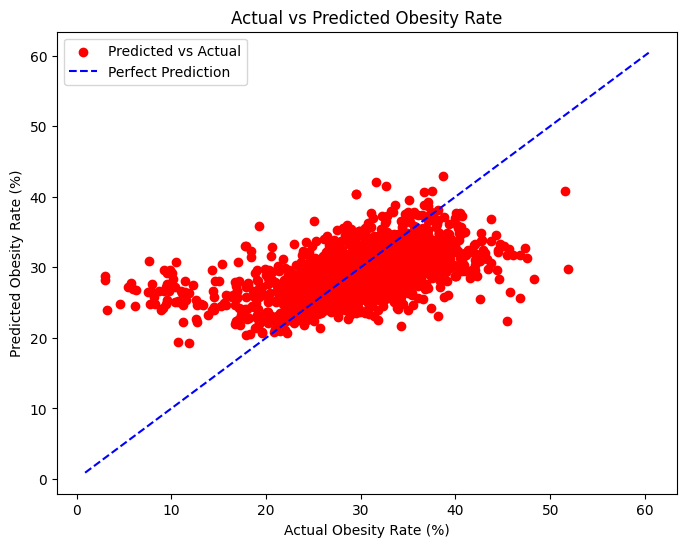

In [34]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='red', label='Predicted vs Actual')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--',color='blue', label='Perfect Prediction')
plt.xlabel('Actual Obesity Rate (%)')
plt.ylabel('Predicted Obesity Rate (%)')
plt.title('Actual vs Predicted Obesity Rate')
plt.legend()
plt.show()